In [1]:
#Installing packages
#!pip install catboost
#!pip install pygam
#!pip install projection-pursuit

#Importing packages
import pandas as pd
import numpy as np
import time

from sklearn import svm, datasets
from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import make_scorer, r2_score, mean_squared_error
from sklearn.neural_network import MLPRegressor
import joblib
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from statsmodels.gam.api import GLMGam, BSplines
from catboost import CatBoostRegressor
import seaborn as sns
from pygam import LinearGAM
from skpp import ProjectionPursuitRegressor
from sklearn.model_selection import RepeatedKFold

from xgboost import XGBRegressor

In [2]:
#Defining ALE Plot functions
#!pip install git+https://github.com/MaximeJumelle/ALEPython.git@dev#egg=alepython
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from alepython.ale import _first_order_ale_quant
from alepython.ale import _second_order_ale_quant,_second_order_quant_plot,_get_centres
from scipy.interpolate import interp2d
from matplotlib.patches import Rectangle

from typing import Callable,Iterable,Union

def first_order_aleplot_quant(
    predictor:Callable,
    train_data:pd.DataFrame,
    feature:str,
    ax:matplotlib.axes.Axes,
    bins:int=10,
    **kwargs):
    '''
    Plot and return the first-order ALE function for a continuous feature.

    Arguments
    ---------
    predictor: callable
        The prediction function. For scikit-learn regressors, pass the `.predict`
        method. For scikit-learn classifiers, either pass the `.predict_proba` method
        or pass a custom log-odds function
    
    train_data: pd.DataFrame
        Training data on which the model was trained. Cannot pass numpy ndarrays.
    
    feature: str
        Feature name. A single column label
    
    ax: matplotlib.axes.Axes
        Pre-existing axes to plot onto
    
    bins : int
        This defines the number of bins to compute. The effective number of bins may
        be less than this as only unique quantile values of train_data[feature] are
        used.
    
    **kwargs: plot properties, optional
        Additional keyword parameters passed to `ax.plot`.
    
    Returns
    ---------
    ax: matplotlib.axes.Axes
        The matplotlib axes containing the plot
    
    ale: np.ndarray
        first order ALE
    
    quantiles: np.ndarray
        The quantiles used
    '''

    ale,quantiles = _first_order_ale_quant(predictor,train_data,feature,bins)
    bin_centers = 0.5*(quantiles[:-1]+quantiles[1:])
    _ = ax.plot(bin_centers,ale,**kwargs)
    _ = sns.rugplot(train_data[feature],ax=ax,color='k',alpha=0.2)
    _ = ax.grid(linestyle="-", alpha=0.4)
    _ = ax.set_xlabel(feature)
    _ = ax.set_ylabel(r'$f_1$(%s)'%feature)
    return ax,ale,quantiles


def second_order_aleplot_quant(
    predictor:Callable,
    train_data:pd.DataFrame,
    features:Iterable[str],
    fig:matplotlib.figure.Figure,
    ax:matplotlib.axes.Axes,
    bins:Union[int,Iterable[int]]=10,
    combined:bool=False,
    mark_empty:bool=True,
    **kwargs):
    '''
    Plot and return the first-order ALE function for a continuous feature.

    Arguments
    ---------
    predictor: callable
        The prediction function. For scikit-learn regressors, pass the `.predict`
        method. For scikit-learn classifiers, either pass the `.predict_proba` method
        or pass a custom log-odds function
    
    train_data: pd.DataFrame
        Training data on which the model was trained. Cannot pass numpy ndarrays.
    
    features: 2-iterable[str]
        The names of the two features
    
    fig: matplotlib.Figure
        pre-existing matplotlib figure object

    ax: matplotlib.axes.Axes
        Pre-existing axes to plot onto
    
    bins : 2-iterable[int] or int (Default: 10)
        This defines the number of bins to compute. The effective number of bins may
        be less than this as only unique quantile values of train_data[feature] are
        used. If only one integer is given, this is used for both the features.

    combined: bool (Default:False)
        If True, the first-order effects are also included in the plot
    
    mark_empty: bool (Default:True)
        If True, plot rectangles over bins that did not contain any samples.
    
    **kwargs: plot properties, optional
        Additional keyword parameters passed to `ax.contourf`.
    
    Returns
    ---------
    ax: matplotlib.axes.Axes
        The matplotlib axes containing the plot
    '''
    if isinstance(bins,int):
        bins = [bins]*2

    ale,quantiles_list = _second_order_ale_quant(predictor,train_data,features,bins)
    centres_list = [_get_centres(quantiles) for quantiles in quantiles_list]
    ale_interp = interp2d(centres_list[0], centres_list[1], ale.T)

    second_order = ale_interp(centres_list[0],centres_list[1])
    if combined:
        # add first order ALE
        ale_x,_= _first_order_ale_quant(predictor,train_data,features[0],bins=bins[0])
        ale_y,_= _first_order_ale_quant(predictor,train_data,features[1],bins=bins[1])

        second_order += ale_x.reshape(1,-1).repeat(ale_y.shape[0],axis=0) + \
            ale_y.reshape(-1,1).repeat(ale_x.shape[0],axis=1)

    X,Y = np.meshgrid(centres_list[0], centres_list[1], indexing="xy")
    CF = ax.contourf(X, Y, second_order, **kwargs)
    if mark_empty and np.any(ale.mask):
        # Do not autoscale, so that boxes at the edges (contourf only plots the bin
        # centres, not their edges) don't enlarge the plot.
        plt.autoscale(False)
        # Add rectangles to indicate cells without samples.
        for i, j in zip(*np.where(ale.mask)):
            _=ax.add_patch(
                Rectangle(
                    [quantiles_list[0][i], quantiles_list[1][j]],
                    quantiles_list[0][i + 1] - quantiles_list[0][i],
                    quantiles_list[1][j + 1] - quantiles_list[1][j],
                    linewidth=1,
                    edgecolor="k",
                    facecolor="none",
                    alpha=0.4,
                )
            )

    _ = fig.colorbar(CF)
    _ = ax.set_xlabel(features[0])
    _ = ax.set_ylabel(features[1])
    return ax

Load dataset

In [3]:
svd8 = pd.read_csv( 'df_analysis.csv', index_col = 0)

In [4]:
svd8.shape

(5490, 35)

In [5]:
svd8.head()

,date,serial_number,model,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_3_normalized,smart_3_raw,smart_4_normalized,...,smart_197_raw,smart_198_normalized,smart_198_raw,smart_199_normalized,smart_199_raw,smart_240_raw,smart_241_raw,smart_242_raw,end_date,useful_life
376,2016-01-01,Z300ZST1,ST4000DM000,1.976651e-311,0,120,240872800,91,0,100,...,0,100,0,200,0,8.206430e-320,1.146406e-313,9.784107e-313,2016-01-17,16
1657,2016-01-01,9VY8TCAV,ST3160318AS,7.907120e-313,0,111,38605541,97,0,100,...,0,100,0,200,0,1.350099e-309,2.004170e-314,2.076417e-314,2016-04-09,99
1895,2016-01-01,W300BG0H,ST4000DM000,1.976651e-311,0,118,190147064,91,0,100,...,0,100,0,200,0,7.857538e-310,1.249659e-313,6.394443e-313,2016-04-18,108
2900,2016-01-01,W300J6FX,ST4000DM000,1.976651e-311,0,115,85258376,92,0,100,...,0,100,0,200,0,1.000186e-319,1.324438e-313,6.040397e-313,2016-04-09,99
3204,2016-01-01,Z3014A4S,ST4000DM000,1.976651e-311,0,116,101976792,91,0,100,...,8,100,8,200,0,8.351192e-320,1.063035e-313,1.019657e-312,2016-01-10,9


Initially, a decision tree was built with all features (except date, serial_number, model, end_date, failure). Based on the feature importance, it was seen that many of the S.M.A.R.T attributes were not important. So they are dropped and all models are re-built. This is also supported by Literature.

In [6]:
col_to_drop = ['date','serial_number', 'model', 'end_date', 'failure', 'smart_5_normalized', 'smart_198_raw',
              'smart_198_normalized','smart_199_normalized','smart_241_raw','smart_240_raw','smart_10_raw',
               'smart_197_normalized','smart_188_raw','smart_12_normalized','smart_10_normalized','smart_7_raw','smart_4_normalized',
               'smart_242_raw']

In [7]:
df = svd8.drop(columns = col_to_drop, axis = 1).reset_index(drop = True)
df.head(5)

,capacity_bytes,smart_1_normalized,smart_1_raw,smart_3_normalized,smart_3_raw,smart_4_raw,smart_5_raw,smart_7_normalized,smart_9_normalized,smart_9_raw,smart_12_raw,smart_194_normalized,smart_194_raw,smart_197_raw,smart_199_raw,useful_life
0,1.976651e-311,120,240872800,91,0,10,0,84,81,16684,10,24.0,24.0,0,0,16
1,7.907120e-313,111,38605541,97,0,32,0,87,50,44519,16,25.0,25.0,0,0,99
2,1.976651e-311,118,190147064,91,0,10,0,87,77,20266,10,19.0,19.0,0,0,108
3,1.976651e-311,115,85258376,92,0,8,0,87,77,20272,8,19.0,19.0,0,0,99
4,1.976651e-311,116,101976792,91,0,9,0,84,81,16919,9,33.0,33.0,8,0,9


In [8]:
df.shape

(5490, 16)

<AxesSubplot:>

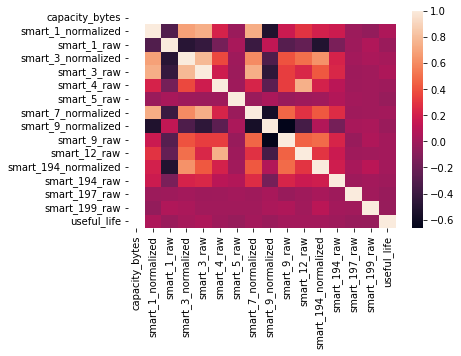

In [9]:
#Correlation plot
#Creating correlation heatmap
sns.heatmap(df.corr())

In [10]:
#Making standardized dataset
from sklearn.preprocessing import StandardScaler

# define standard scaler
scaler = StandardScaler()
  
# transform data
df_stan_np = scaler.fit_transform(df.drop(columns = ['useful_life'], axis = 1))
df_stan = pd.DataFrame(df_stan_np, columns=df.drop(columns = ['useful_life'], axis = 1).columns)
df_stan['useful_life'] = df.useful_life
df_stan.head(5)

,capacity_bytes,smart_1_normalized,smart_1_raw,smart_3_normalized,smart_3_raw,smart_4_raw,smart_5_raw,smart_7_normalized,smart_9_normalized,smart_9_raw,smart_12_raw,smart_194_normalized,smart_194_raw,smart_197_raw,smart_199_raw,useful_life
0,4.848724e-312,-0.166916,1.781884,-0.635439,-0.392672,-0.225318,-0.060977,-0.403087,0.014886,-0.230492,-0.252155,-0.559533,-0.626597,-0.034868,-0.044638,16
1,-1.412708e-311,-0.454079,-0.640416,-0.333595,-0.392672,0.345204,-0.060977,-0.306883,-2.089302,1.999519,-0.044048,-0.543088,-0.439232,-0.034868,-0.044638,99
2,4.848724e-312,-0.230730,1.174406,-0.635439,-0.392672,-0.225318,-0.060977,-0.306883,-0.256622,0.056481,-0.252155,-0.641756,-1.563422,-0.034868,-0.044638,108
3,4.848724e-312,-0.326451,-0.081714,-0.585131,-0.392672,-0.277184,-0.060977,-0.306883,-0.256622,0.056962,-0.321525,-0.641756,-1.563422,-0.034868,-0.044638,99
4,4.848724e-312,-0.294544,0.118502,-0.635439,-0.392672,-0.251251,-0.060977,-0.403087,0.014886,-0.211665,-0.286840,-0.411531,1.059687,-0.001510,-0.044638,9


In [11]:
df_stan.shape

(5490, 16)

In [12]:
#Finding the number of unique values per feature
for feature_name, feature_values in df_stan.iteritems():
    print('The Number of unique values for feature ', feature_name,': ', feature_values.unique().shape[0])

The Number of unique values for feature  capacity_bytes :  10
The Number of unique values for feature  smart_1_normalized :  57
The Number of unique values for feature  smart_1_raw :  4057
The Number of unique values for feature  smart_3_normalized :  46
The Number of unique values for feature  smart_3_raw :  54
The Number of unique values for feature  smart_4_raw :  57
The Number of unique values for feature  smart_5_raw :  113
The Number of unique values for feature  smart_7_normalized :  30
The Number of unique values for feature  smart_9_normalized :  59
The Number of unique values for feature  smart_9_raw :  4516
The Number of unique values for feature  smart_12_raw :  53
The Number of unique values for feature  smart_194_normalized :  77
The Number of unique values for feature  smart_194_raw :  30
The Number of unique values for feature  smart_197_raw :  32
The Number of unique values for feature  smart_199_raw :  11
The Number of unique values for feature  useful_life :  78


# Train-Test Split

In [13]:
#For non-standardized data
X = df.drop(columns = ['useful_life'], axis = 1)
y = df.useful_life
train_X_ns, test_X_ns, train_y_ns, test_y_ns = train_test_split(X, y, test_size = 0.2, random_state = 123)

# train_X_ns.reset_index(drop = True, inplace = True)
# train_y_ns.reset_index(drop=True, inplace = True)
# test_X_ns.reset_index(drop = True, inplace = True)
# test_y_ns.reset_index(drop=True, inplace = True)

In [14]:
#For standardized data
X = df_stan.drop(columns = ['useful_life'], axis = 1)
y = df_stan.useful_life

train_X_s, test_X_s, train_y_s, test_y_s = train_test_split(X, y, test_size = 0.2, random_state = 123)

# train_X_s.reset_index(drop = True, inplace = True)
# train_y_s.reset_index(drop=True, inplace = True)
# test_X_s.reset_index(drop = True, inplace = True)
# test_y_s.reset_index(drop=True, inplace = True)

# Parameters for gridsearchcv

In [15]:
# Ridge Regression parameter dictionary
ridge_param = {
    #'solver':['svd', 'cholesky', 'lsqr', 'sag'],
    'alpha': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100] #,
    #'fit_intercept':[True, False],
    #'normalize':[True, False]
}

# Parameters for Random Forest
rf_params = {'n_estimators': [500], # Number of trees in random forest
               'max_features': [int(x) for x in np.linspace(3, 5, num = 1)], # Maximum number of levels in tree
               'min_samples_leaf': [int(x) for x in np.linspace(2, 6, num = 2)], # Minimum number of samples required at each leaf node
               'bootstrap': [True], # Method of selecting samples for training each tree.
             'max_depth': [int(x) for x in np.linspace(3, 12, num = 3)], # Maximum number of levels in tree
                }

#Decision Tree requires pruning via ccp_alpha. Hence, it is not tuned with gridsearchcv.

#Parameters for gradient boosting
gb_params = {'learning_rate': [0.01,0.02,0.03,0.04],
                  #'subsample'    : [1, 0.9, 0.8],
                  'n_estimators' : [int(x) for x in np.linspace(start = 50, stop = 150, num = 25)], #Number of trees
                  'max_depth'    : [int(x) for x in np.linspace(start = 4, stop = 8, num = 1)], #Max depth of a tree
             'min_samples_leaf': [1, 2, 4], # Minimum number of samples required at each leaf node
                 }

#Parameters for XGBoost
xgb_params = {
    'max_depth': range(2, 10, 2),
    'max_leaves': range(4,8),
    'n_estimators': range(60, 220, 20),
    #"min_child_weight":[1, 3, 5],
    'learning_rate': [0.1, 0.01, 0.05]}

#Parameters for neural network
nn_params = {'hidden_layer_sizes': range(20,30,2), # scalar -> single hidden layer with 20 units
    'activation': ['logistic'], # activation function for the hidden layer
    'solver': ['lbfgs','sgd','adam'], # deterministic optimizer (not the default)
    'alpha': [0.01, 0.05, 0.1],# regularization parameter
    'max_iter': [1000] # number of LBFGS steps
            }

#Parameters for KNN
knn_params ={'n_neighbors': range(5,15)}

#Parameters for PPR
ppr_params = {'r': [10,15]}

#Parameters for CatBoost
cat_params = {'max_depth': [3,4,5],'n_estimators':[100, 200, 300]}




In [16]:
scoring_metrics = {'r2_score': make_scorer(r2_score),
           'mse': make_scorer(mean_squared_error)}

# **Modeling**

In [17]:
#Making folds for CV
#5 fold CV is used since it was taking too long for 10 fold on this data set
folds = KFold(n_splits=10, shuffle = True, random_state = 421)
folds

KFold(n_splits=10, random_state=421, shuffle=True)

### Ridge Regression
(Benchmark model)

##### Non-standardized data

In [18]:
model = Ridge()
# define search
search = GridSearchCV(model, ridge_param, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)


/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=3.62888e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=3.55565e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=3.52869e-24): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=3.54004e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/nfs/home/smv7369/.local/lib/python3

In [19]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: -0.01796057894108699
Best Hyperparameters: {'alpha': 100}


In [20]:
#Checking test score with best model
best_model = Ridge(alpha = result.best_params_['alpha']).fit(train_X_ns, train_y_ns)
predictions = best_model.predict(test_X_ns)

/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:212: LinAlgWarning: Ill-conditioned matrix (rcond=3.21308e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


In [21]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.007824574630486913
Test MSE:  1926.9247613207485


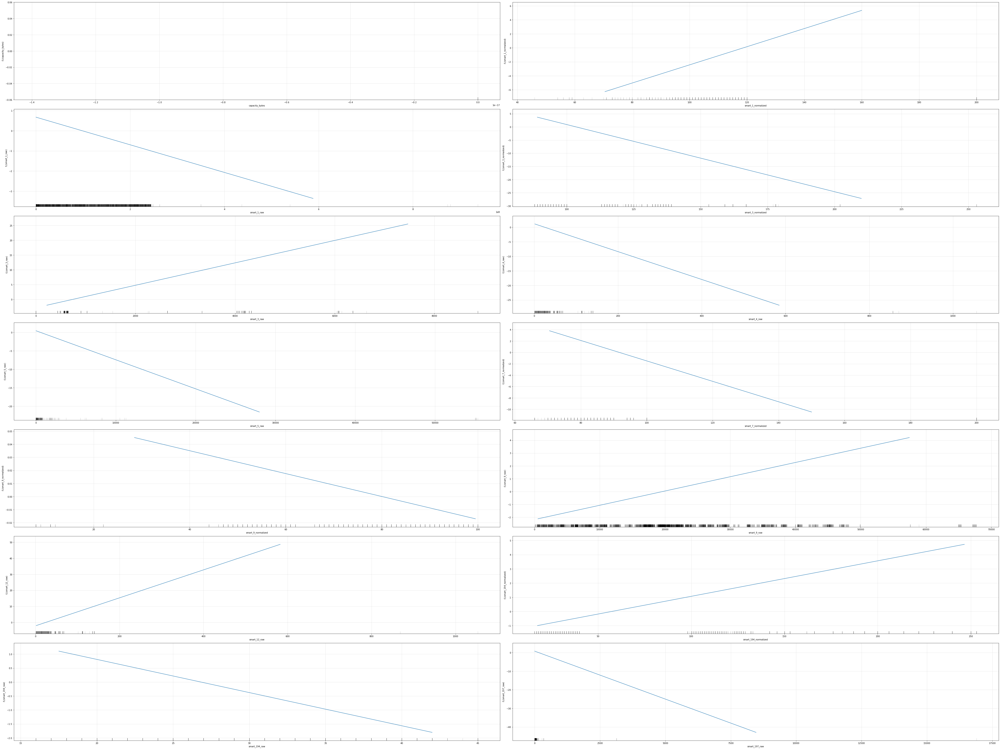

In [22]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

##### Standardized data

In [23]:
model = Ridge()
# define search
search = GridSearchCV(model, ridge_param, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_s, train_y_s)

In [24]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: -0.010831038532392112
Best Hyperparameters: {'alpha': 100}


In [25]:
%%time
#Checking test score with best model
best_model = Ridge(alpha = result.best_params_['alpha']).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

In [26]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.007655466354945073
Test MSE:  1927.2531900594108


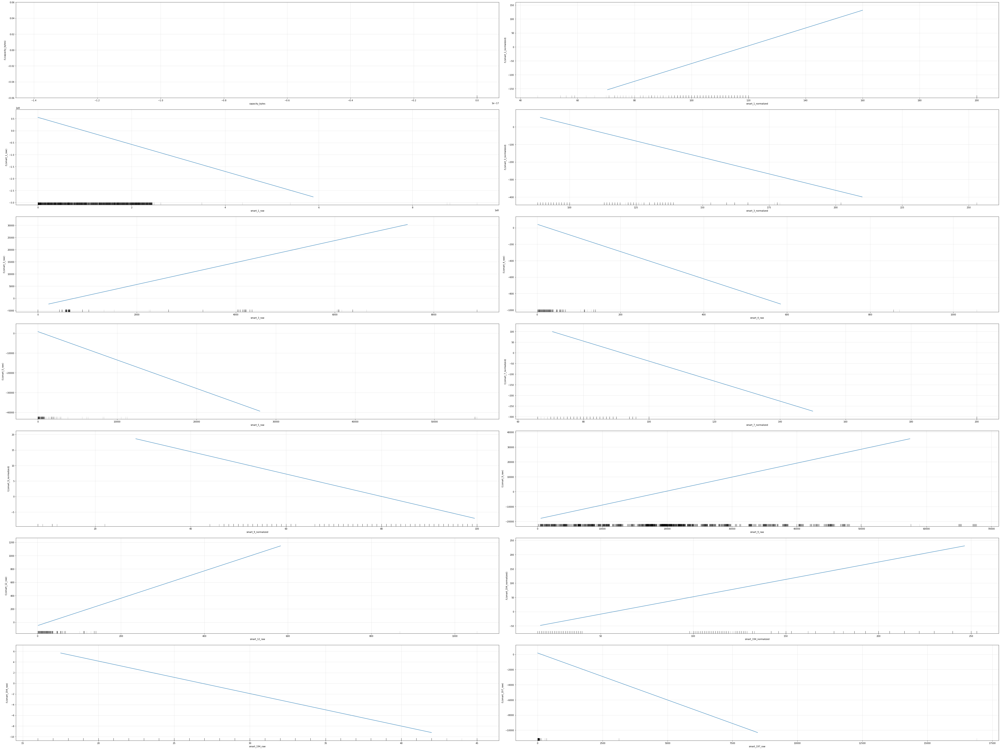

In [27]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

### Regression Tree (Decision Tree)

##### Non-Standardized Data

The code below is borrowed from Lab session since scikit learn implementation of pruning is not as straightforward as rpart in R.

While doing CV, the folds are maintained. Hence, the results are comparable.

In [28]:
# extract predictors and response - standardization makes no difference
X = train_X_ns.values # extract as numpy ndarray
y = train_y_ns.values

# extract feature names to be used later in visualizations
feature_names = train_X_ns.columns.tolist()

In [29]:
#Overgrowing the initial tree
reg_tree = DecisionTreeRegressor(
    min_samples_leaf=5, # equivalent to minbucket in rpart
    ccp_alpha=1e-4, # cost complexity parameter
)
# fit tree 
# grows a large tree and prunes it back to match ccp_alpha 1e-4
_ = reg_tree.fit(X,y)

In [30]:
# compute the cost-complexity pruning path for the tree
ccp_path = reg_tree.cost_complexity_pruning_path(X,y)
ccp_alphas, impurities = ccp_path.ccp_alphas[1:], ccp_path.impurities[1:]

Impurity within one node
1975.1890139714203


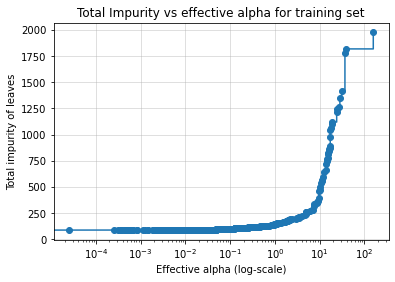

In [31]:
# plot of impurities vs ccp_alpha
fig, ax = plt.subplots()
_ = ax.plot(ccp_alphas, impurities, marker="o", drawstyle="steps-post")
_ = ax.set_xlabel("Effective alpha (log-scale)")
_ = ax.set_ylabel("Total impurity of leaves")
_ = ax.set_title("Total Impurity vs effective alpha for training set")
_ = ax.semilogx()
_ = ax.grid(alpha=0.5)

# impurity with one node - mean squared error
print("Impurity within one node")
print(np.mean((y-y.mean())**2))

In [32]:
mses = np.empty((folds.n_splits,ccp_alphas.shape[0]))
r2s = np.empty((folds.n_splits,ccp_alphas.shape[0]))

for i,(train_index,test_index) in enumerate(folds.split(X)):
    
    # initialize tree for this fold and fit large tree
    tree_fold = DecisionTreeRegressor(min_samples_leaf=5).fit(X[train_index,:],y[train_index])
    
    for j,alpha in enumerate(ccp_alphas):
        # update the value of alpha
        tree_fold.set_params(**{'ccp_alpha':alpha})
        
        # prune the tree further
        _ = tree_fold._prune_tree()
        
        # compute predictions and evaluate on test set 
        y_pred_test = tree_fold.predict(X[test_index,:])
        mses[i,j] = mean_squared_error(y[test_index],y_pred_test)
        r2s[i,j] = r2_score(y[test_index],y_pred_test)

In [33]:
# CV estimates
mse_cv = mses.mean(axis=0)
r2_cv = 1-mse_cv/y.var()

In [34]:
#  maximum r2
idx_r2max = r2_cv.argmax()

print('Best R^2...: %.3f'%(r2_cv[idx_r2max]))
print('Best CV MSE...: %.3f'%(mse_cv[idx_r2max]))
print('Corresponding ccp_alpha: ', ccp_alphas[idx_r2max])

Best R^2...: 0.883
Best CV MSE...: 231.890
Corresponding ccp_alpha:  0.00025715204114432663


In [35]:
# prune back initial tree with the best CV accuracy
reg_tree.set_params(ccp_alpha=ccp_alphas[idx_r2max])
reg_tree._prune_tree()

In [36]:
#Metrics on Test set
predictions = reg_tree.predict(test_X_ns)
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.8946525231892315
Test MSE:  204.59755041174472


/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(


<BarContainer object of 15 artists>

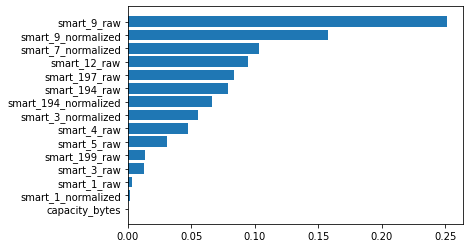

In [37]:
#Plotting feature importance
feat_imp = reg_tree.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_ns.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

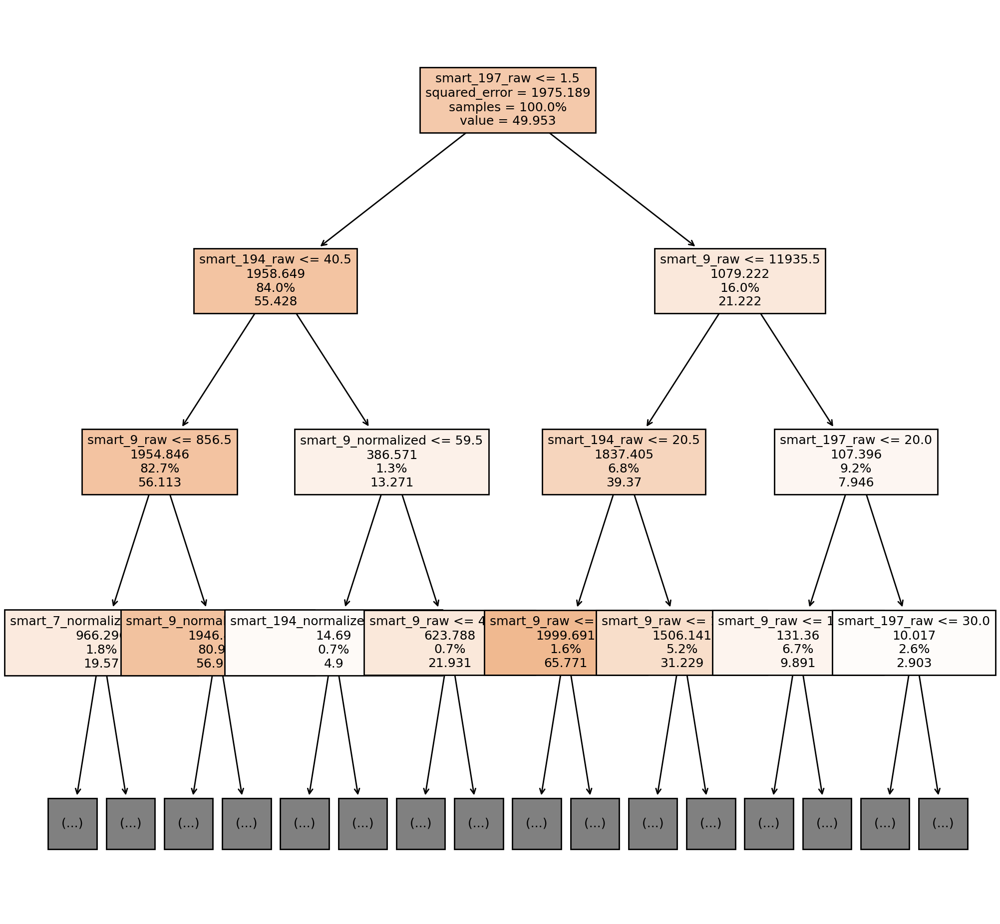

In [38]:
# visualize tree
fig = plt.figure(figsize=(12,12),dpi=200)
_ = plot_tree(
    reg_tree,
    feature_names=train_X_ns.columns,
    max_depth=3,
    label='root',
    fontsize=9,
    proportion=True,
    filled=True 
)

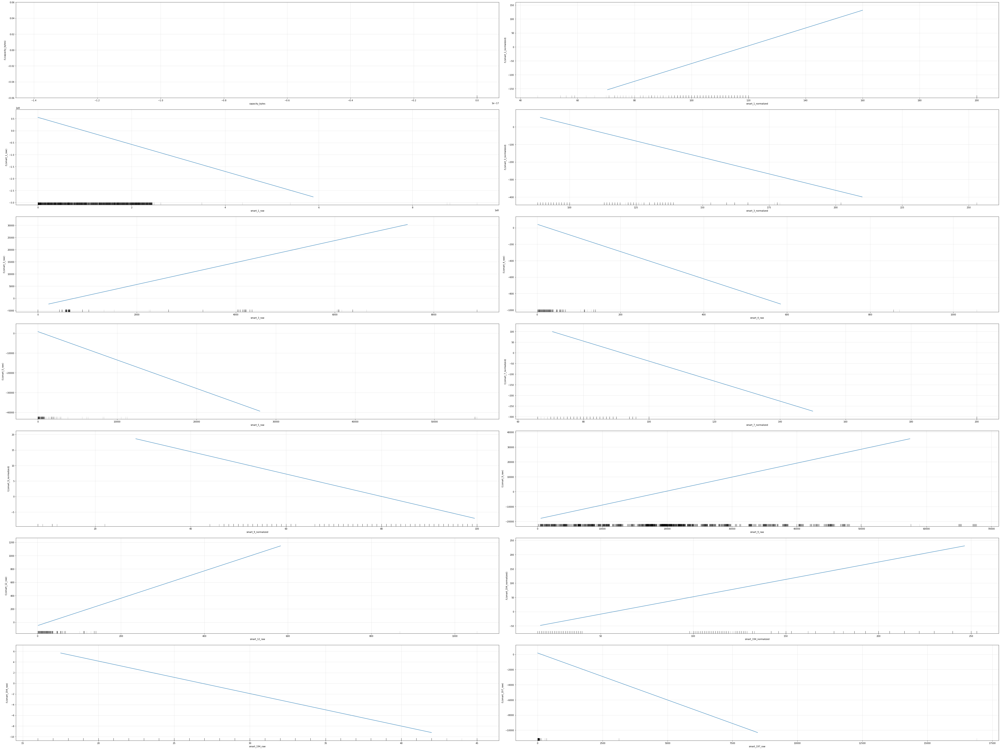

In [39]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

##### Standardized data

In [40]:
# extract predictors and response - standardization makes no difference
X = train_X_s.values # extract as numpy ndarray
y = train_y_s.values

# extract feature names to be used later in visualizations
feature_names = train_X_s.columns.tolist()

In [41]:
%%time
#Overgrowing the initial tree
reg_tree = DecisionTreeRegressor(
    min_samples_leaf=5, # equivalent to minbucket in rpart
    ccp_alpha=1e-4, # cost complexity parameter
)
# fit tree 
# grows a large tree and prunes it back to match ccp_alpha 1e-4
_ = reg_tree.fit(X,y)

Impurity within one node
1975.1890139714203


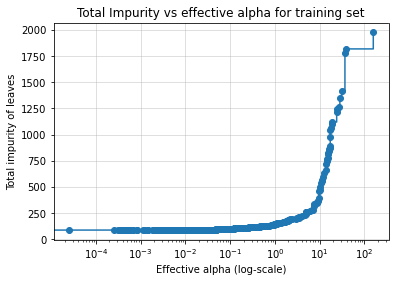

In [42]:
# compute the cost-complexity pruning path for the tree
ccp_path = reg_tree.cost_complexity_pruning_path(X,y)
ccp_alphas, impurities = ccp_path.ccp_alphas[1:], ccp_path.impurities[1:]

# plot of impurities vs ccp_alpha
fig, ax = plt.subplots()
_ = ax.plot(ccp_alphas, impurities, marker="o", drawstyle="steps-post")
_ = ax.set_xlabel("Effective alpha (log-scale)")
_ = ax.set_ylabel("Total impurity of leaves")
_ = ax.set_title("Total Impurity vs effective alpha for training set")
_ = ax.semilogx()
_ = ax.grid(alpha=0.5)

# impurity with one node - mean squared error
print("Impurity within one node")
print(np.mean((y-y.mean())**2))

In [43]:
np.random.seed(1234)
mses = np.empty((folds.n_splits,ccp_alphas.shape[0]))
r2s = np.empty((folds.n_splits,ccp_alphas.shape[0]))

for i,(train_index,test_index) in enumerate(folds.split(X)):
    
    # initialize tree for this fold and fit large tree
    tree_fold = DecisionTreeRegressor(min_samples_leaf=5).fit(X[train_index,:],y[train_index])
    
    for j,alpha in enumerate(ccp_alphas):
        # update the value of alpha
        tree_fold.set_params(**{'ccp_alpha':alpha})
        
        # prune the tree further
        _ = tree_fold._prune_tree()
        
        # compute predictions and evaluate on test set 
        y_pred_test = tree_fold.predict(X[test_index,:])
        mses[i,j] = mean_squared_error(y[test_index],y_pred_test)
        r2s[i,j] = r2_score(y[test_index],y_pred_test)

In [44]:
# CV estimates
mse_cv = mses.mean(axis=0)
r2_cv = 1-mse_cv/y.var()

In [45]:
#  maximum r2
idx_r2max = r2_cv.argmax()

print('Best CV R^2...: %.3f'%(r2_cv[idx_r2max]))
print('Best CV MSE...: %.3f'%(mse_cv[idx_r2max]))
print('Corresponding ccp_alpha: ', ccp_alphas[idx_r2max])

Best CV R^2...: 0.882
Best CV MSE...: 232.121
Corresponding ccp_alpha:  0.002755009107459923


In [46]:
%%time
# prune back initial tree with the best CV accuracy
reg_tree.set_params(ccp_alpha=ccp_alphas[idx_r2max])
reg_tree._prune_tree()
reg_tree

DecisionTreeRegressor(ccp_alpha=0.002755009107459923, min_samples_leaf=5)

In [47]:
#Metrics on Test set
predictions = reg_tree.predict(test_X_s)
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.8966605535902207
Test MSE:  200.69771233652745


/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(


<BarContainer object of 15 artists>

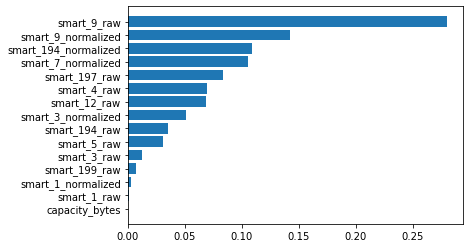

In [48]:
#Plotting feature importance
feat_imp = reg_tree.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_s.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

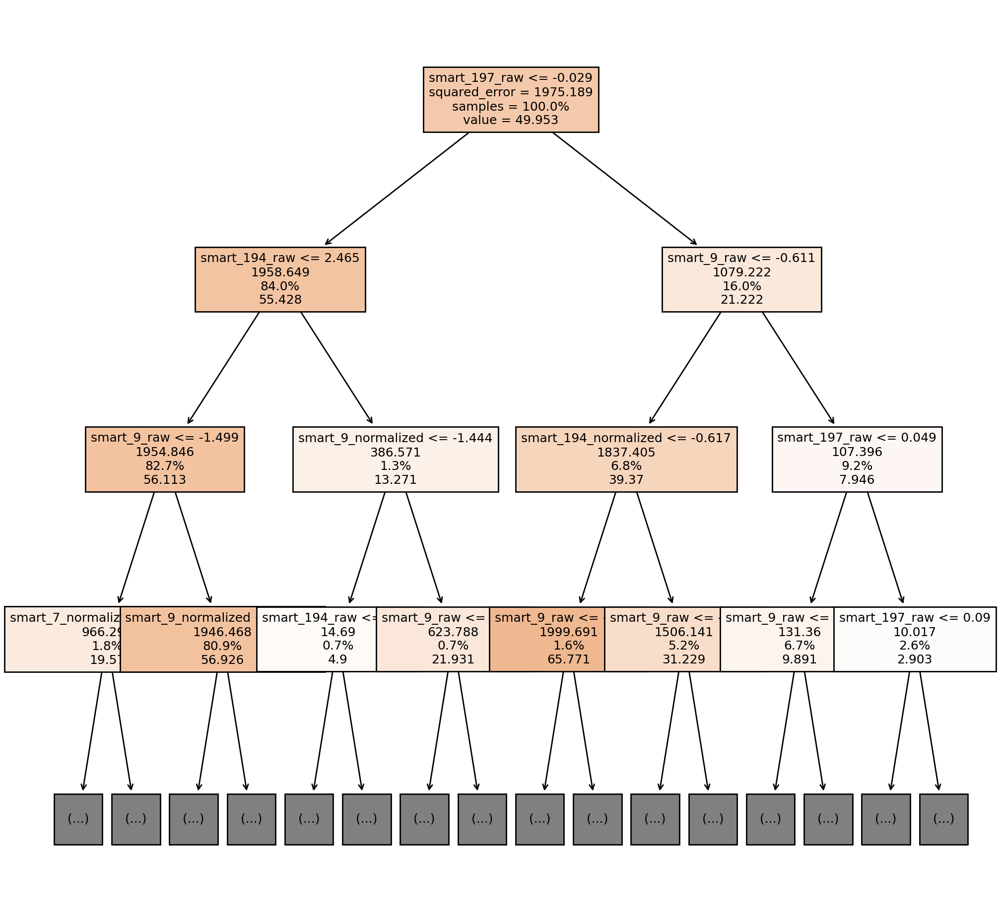

In [49]:
# visualize tree
fig = plt.figure(figsize=(12,12),dpi=200)
_ = plot_tree(
    reg_tree,
    feature_names=train_X_s.columns,
    max_depth=3,
    label='root',
    fontsize=9,
    proportion=True,
    filled=True 
)

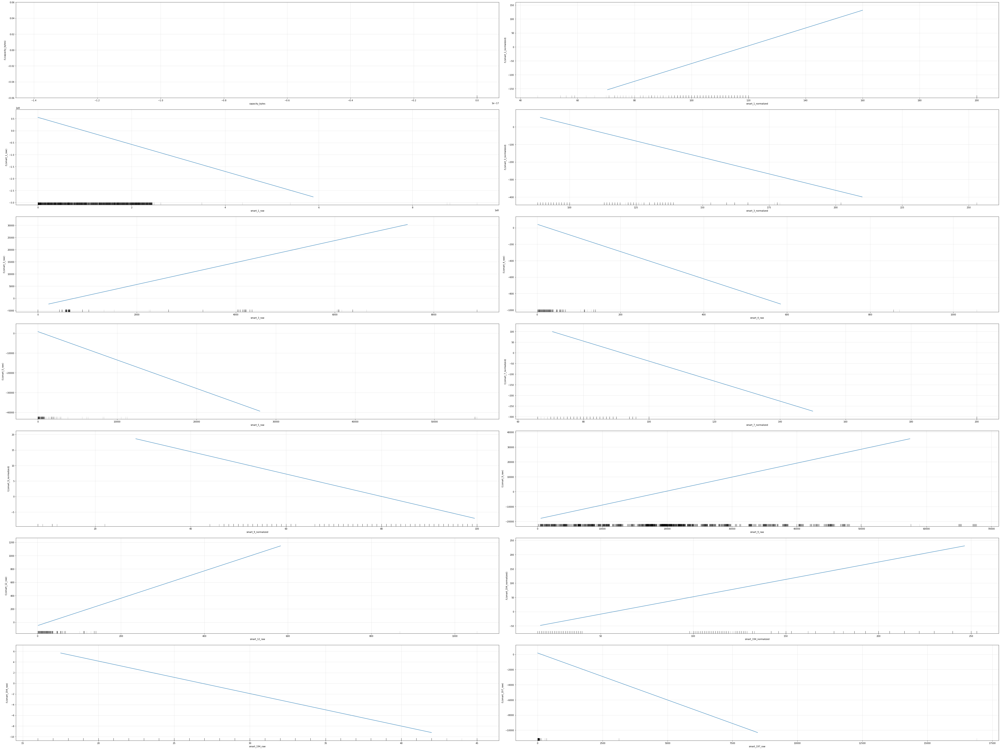

In [50]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

### Random Forest

##### Non-Standardized Data

In [51]:
model = RandomForestRegressor()
# define search
search = GridSearchCV(model, rf_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

In [52]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.7369602201936161
Best Hyperparameters: {'bootstrap': True, 'max_depth': 12, 'max_features': 3, 'min_samples_leaf': 2, 'n_estimators': 500}


In [53]:
#Checking test score with best model
best_model = RandomForestRegressor(n_estimators = result.best_params_['n_estimators'], max_features = result.best_params_['max_features'], min_samples_leaf = result.best_params_['min_samples_leaf'], bootstrap = True, max_depth = result.best_params_['max_depth']).fit(train_X_ns, train_y_ns)
predictions = best_model.predict(test_X_ns)

In [54]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.7370752786250339
Test MSE:  510.6316312884849


<BarContainer object of 15 artists>

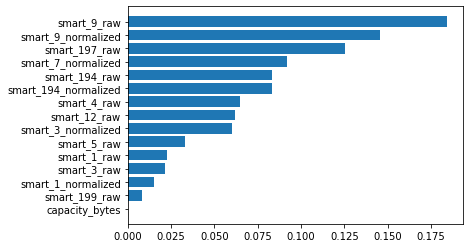

In [55]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_ns.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

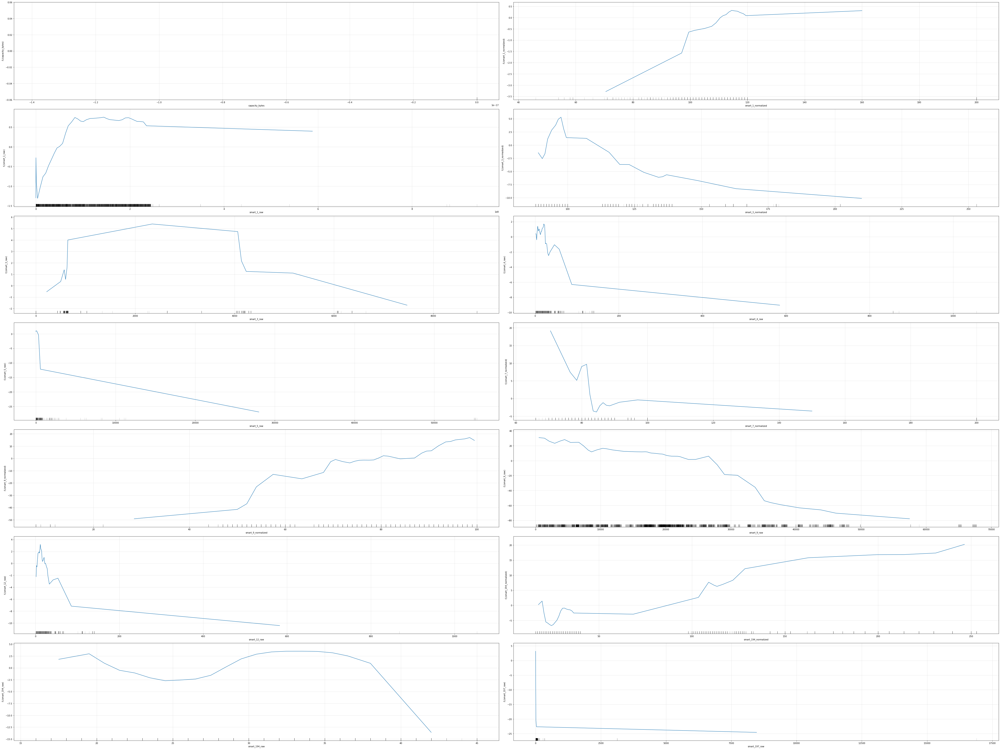

In [57]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

##### Standardized data

In [58]:
model = RandomForestRegressor()
# define search
search = GridSearchCV(model, rf_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_s, train_y_s)

In [59]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.7330989878891454
Best Hyperparameters: {'bootstrap': True, 'max_depth': 12, 'max_features': 3, 'min_samples_leaf': 2, 'n_estimators': 500}


In [60]:
%%time
#Checking test score with best model
best_model = RandomForestRegressor(n_estimators = result.best_params_['n_estimators'], max_features = result.best_params_['max_features'], min_samples_leaf = result.best_params_['min_samples_leaf'], bootstrap = True, max_depth = result.best_params_['max_depth']).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

In [61]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.7346238891888498
Test MSE:  515.3925262708052


<BarContainer object of 15 artists>

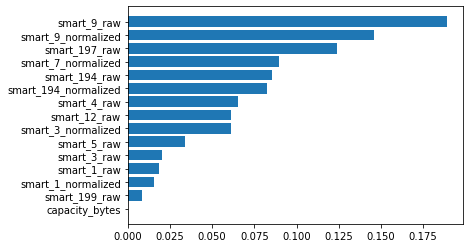

In [62]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_s.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

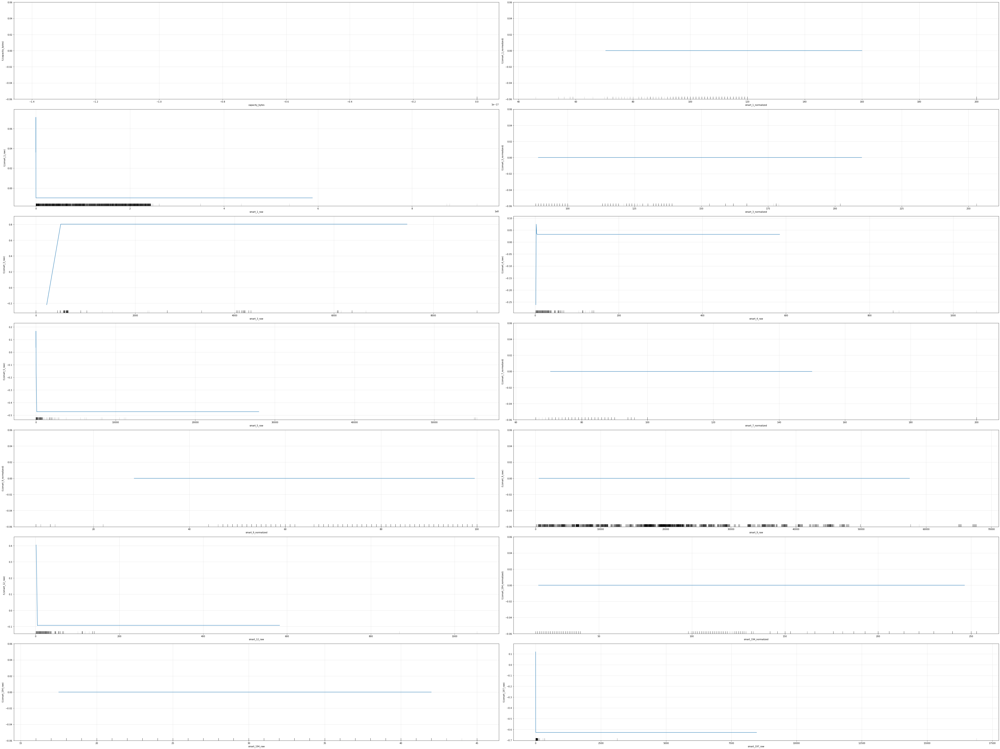

In [63]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

### Boosted Tree

##### Non-Standardized Data

In [64]:
model = GradientBoostingRegressor()
# define search
search = GridSearchCV(model, gb_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

In [65]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.5378391794102082
Best Hyperparameters: {'learning_rate': 0.04, 'max_depth': 4, 'min_samples_leaf': 2, 'n_estimators': 150}


In [66]:
#Checking test score with best model
best_model = GradientBoostingRegressor(n_estimators = result.best_params_['n_estimators'], learning_rate = result.best_params_['learning_rate'], min_samples_leaf = result.best_params_['min_samples_leaf'], max_depth = result.best_params_['max_depth']).fit(train_X_ns, train_y_ns)
predictions = best_model.predict(test_X_ns)

In [67]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.5028930597799615
Test MSE:  965.4418438933236


<BarContainer object of 15 artists>

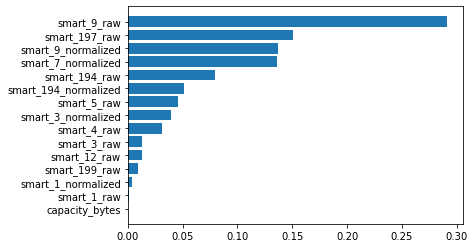

In [68]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_ns.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

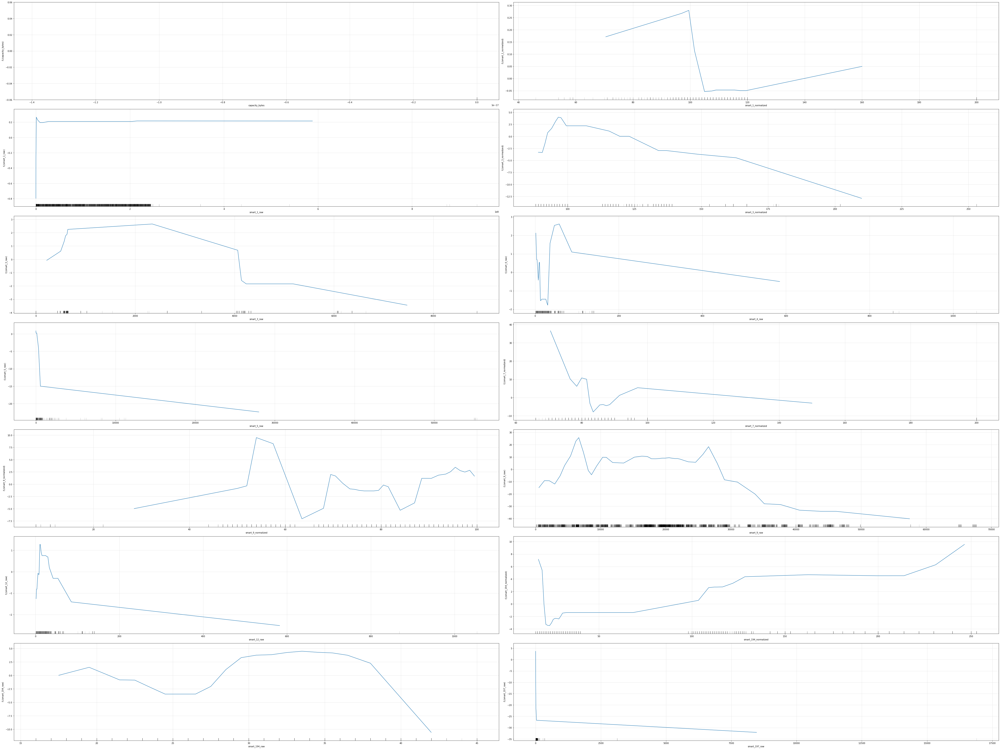

In [69]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

##### Standardized data

In [70]:
model = GradientBoostingRegressor()
# define search
search = GridSearchCV(model, gb_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_s, train_y_s)

In [71]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.536330603333227
Best Hyperparameters: {'learning_rate': 0.04, 'max_depth': 4, 'min_samples_leaf': 2, 'n_estimators': 150}


In [72]:
%%time
#Checking test score with best model
best_model = GradientBoostingRegressor(n_estimators = result.best_params_['n_estimators'], learning_rate = result.best_params_['learning_rate'], min_samples_leaf = result.best_params_['min_samples_leaf'], max_depth = result.best_params_['max_depth']).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

In [73]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.5030684596451702
Test MSE:  965.1011961260426


<BarContainer object of 15 artists>

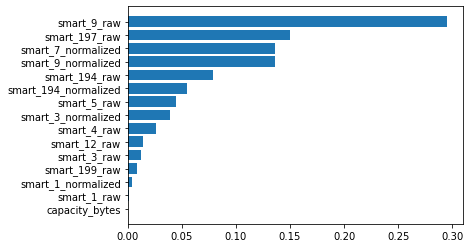

In [74]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_s.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

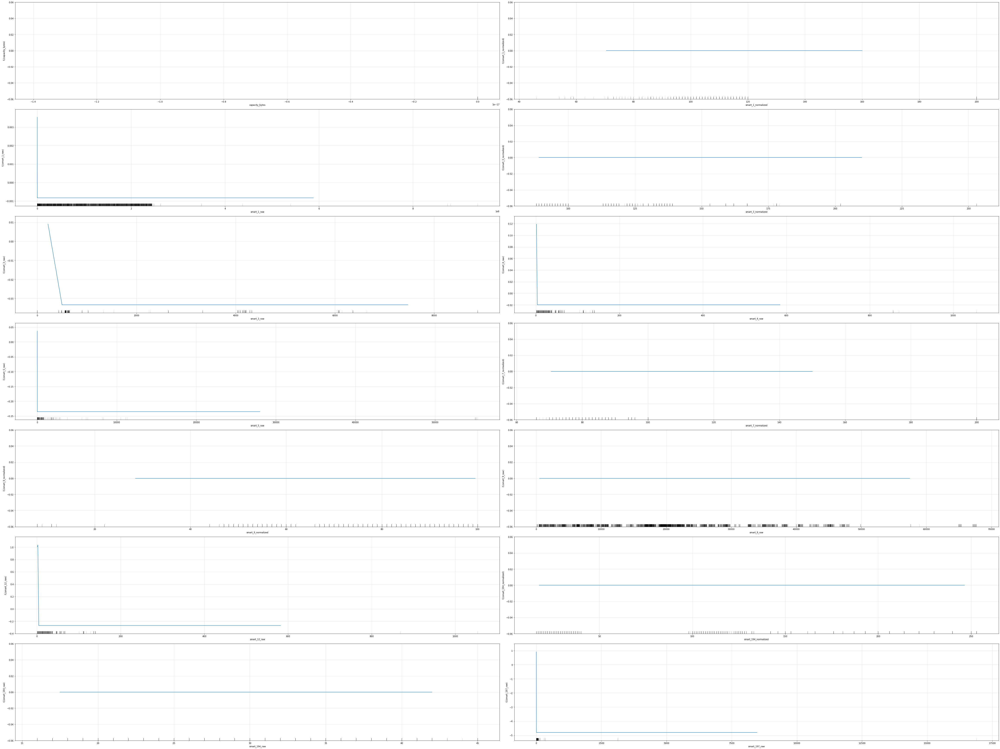

In [75]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

### XGBoost

##### Non-Standardized Data

In [76]:
model = XGBRegressor()
# define search
search = GridSearchCV(model, xgb_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

In [77]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.9548049382580734
Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 8, 'max_leaves': 4, 'n_estimators': 200}


In [78]:
#Checking test score with best model
best_model = XGBRegressor(n_estimators = result.best_params_['n_estimators'], max_leaves = result.best_params_['max_leaves'], learning_rate = result.best_params_['learning_rate'], max_depth = result.best_params_['max_depth']).fit(train_X_ns, train_y_ns)
predictions = best_model.predict(test_X_ns)

In [79]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.955420079799722
Test MSE:  86.57960063829077


<BarContainer object of 15 artists>

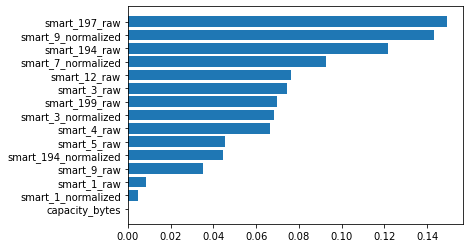

In [80]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_ns.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

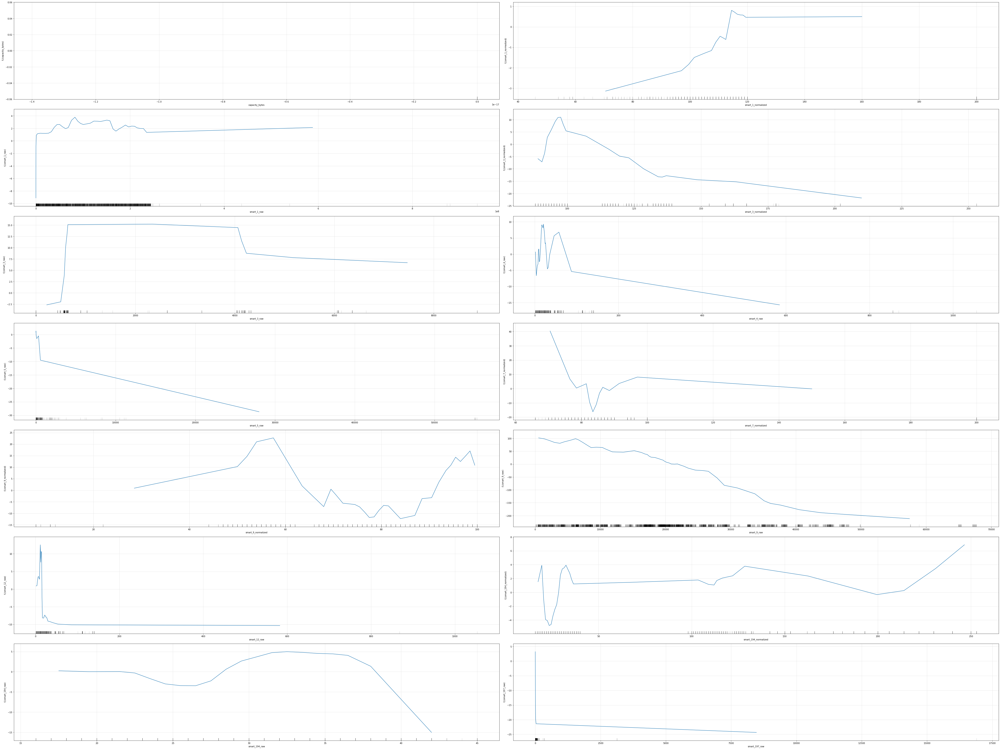

In [81]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

##### Standardized data

In [82]:
model = XGBRegressor()
# define search
search = GridSearchCV(model, xgb_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_s, train_y_s)

In [83]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.9551303266037804
Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 8, 'max_leaves': 4, 'n_estimators': 200}


In [84]:
%%time
#Checking test score with best model
best_model = XGBRegressor(n_estimators = result.best_params_['n_estimators'], max_leaves = result.best_params_['max_leaves'], learning_rate = result.best_params_['learning_rate'], max_depth = result.best_params_['max_depth']).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

In [85]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.9581669160485602
Test MSE:  81.24491218719515


<BarContainer object of 15 artists>

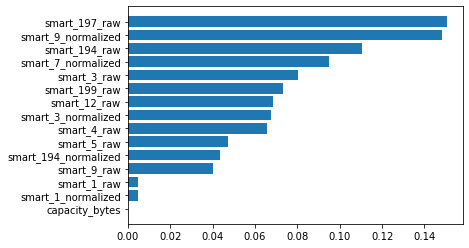

In [86]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_s.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

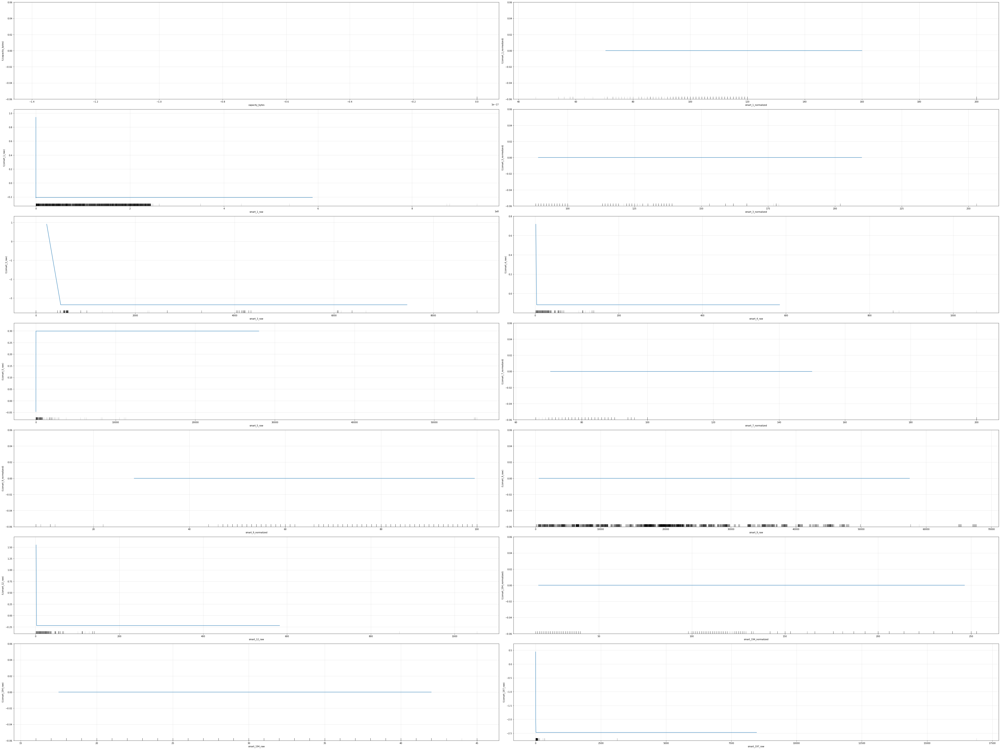

In [87]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

# Neural network

### Non-standardized data

In [88]:
model = MLPRegressor()
# define search
search = GridSearchCV(model, nn_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNOR

In [89]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.016301737695768016
Best Hyperparameters: {'activation': 'logistic', 'alpha': 0.05, 'hidden_layer_sizes': 22, 'max_iter': 1000, 'solver': 'lbfgs'}


In [90]:
#Checking test score with best model
best_model = MLPRegressor(hidden_layer_sizes = result.best_params_['hidden_layer_sizes'], activation = result.best_params_['activation'], solver = result.best_params_['solver'], alpha = result.best_params_['alpha'], max_iter = result.best_params_['max_iter']).fit(train_X_ns, train_y_ns)
predictions = best_model.predict(test_X_ns)

In [91]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  -0.0011370363069334033
Test MSE:  1944.3292944054162


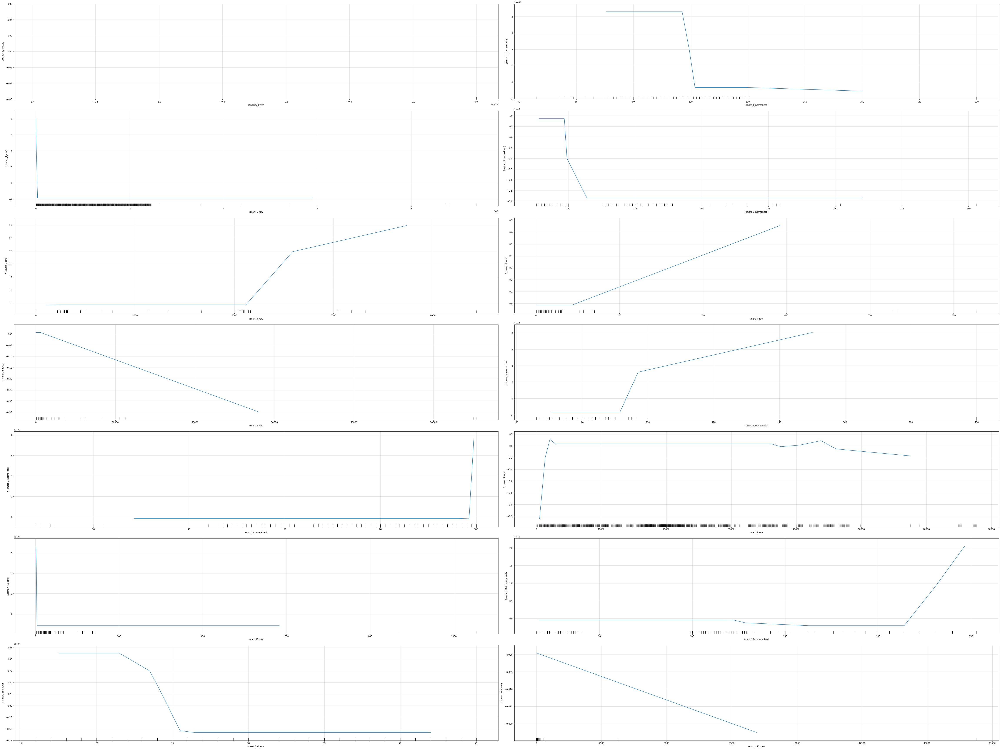

In [92]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

### Standardized data 

In [94]:
model = MLPRegressor()
# define search
search = GridSearchCV(model, nn_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_s, train_y_s)

/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (sta

In [95]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.5678524948565433
Best Hyperparameters: {'activation': 'logistic', 'alpha': 0.05, 'hidden_layer_sizes': 28, 'max_iter': 1000, 'solver': 'sgd'}


In [96]:
%%time
#Checking test score with best model
best_model = MLPRegressor(hidden_layer_sizes = result.best_params_['hidden_layer_sizes'], activation = result.best_params_['activation'], solver = result.best_params_['solver'], alpha = result.best_params_['alpha'], max_iter = result.best_params_['max_iter']).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

/nfs/home/smv7369/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [97]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.5476375942039144
Test MSE:  878.5425425090212


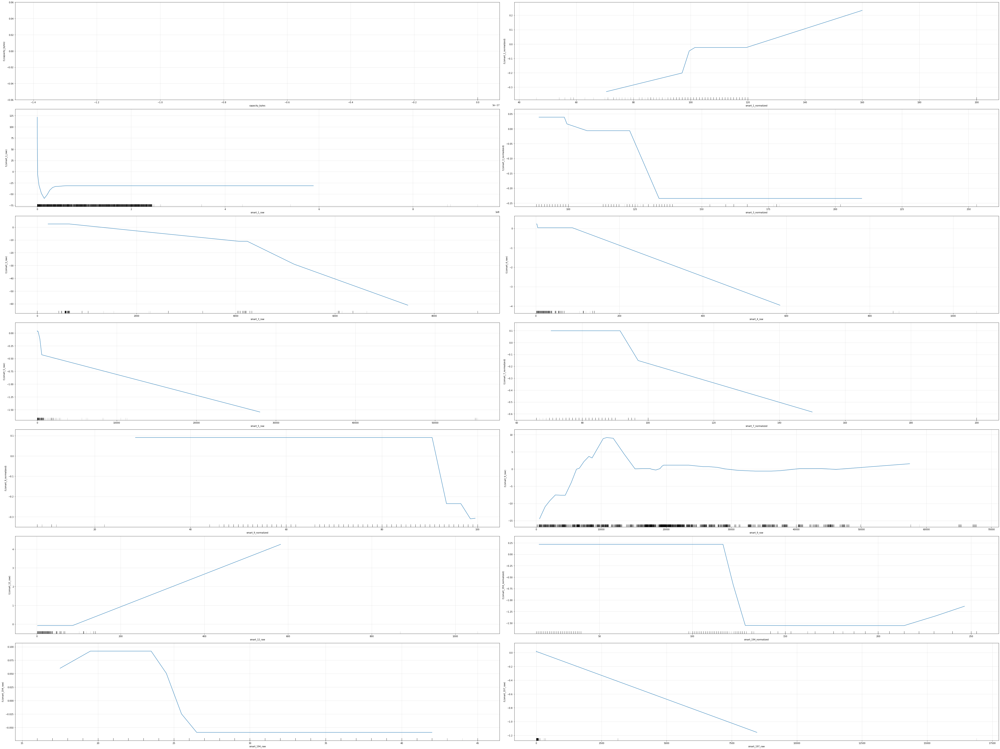

In [98]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

# N Nearest Neighbours

### Non-standardized data 

In [99]:
model = KNeighborsRegressor()
# define search
search = GridSearchCV(model, knn_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

In [100]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.11329766492523793
Best Hyperparameters: {'n_neighbors': 14}


In [101]:
#Checking test score with best model
best_model = XGBRegressor().fit(train_X_ns, train_y_ns)
predictions = best_model.predict(test_X_ns)

In [102]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.9489525454146219
Test MSE:  99.14033519458299


### Standardized data 

In [103]:
model = KNeighborsRegressor()
# define search
search = GridSearchCV(model, knn_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

In [104]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.11329766492523793
Best Hyperparameters: {'n_neighbors': 14}


In [105]:
%%time
#Checking test score with best model
best_model = XGBRegressor().fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

In [106]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.9504534619249931
Test MSE:  96.22537367209584


### GAM

##### Non-standardized data

In [20]:
from pygam import LinearGAM

n_folds = 10
n_repeats = 1
mses_rkf = np.empty(n_folds*n_repeats)
train_X_ns = train_X_ns.reset_index()
train_X_ns = train_X_ns.drop(columns = 'index')
train_y_ns = train_y_ns.reset_index()
train_y_ns = train_y_ns.drop(columns = 'index')
train_ns = pd.concat([train_X_ns,train_y_ns],axis = 1)
for i,(train_index,test_index) in enumerate(folds.split(train_ns)):
    gam = LinearGAM().fit(train_X_ns.loc[train_index,:].values,train_y_ns.loc[train_index,:].values)
    # compute test predictions
    y_pred = gam.predict(train_X_ns.loc[test_index,:])
    # compute metric-mean-squared error
    mses_rkf[i] = mean_squared_error(train_y_ns.loc[test_index,:],y_pred)

mse_cv = mses_rkf.mean()

r2_cv = 1-mse_cv/train_y_ns['useful_life'].var()

In [21]:
r2_cv

-0.8661573795456154

In [22]:
predictions = gam.predict(test_X_ns)

In [23]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.20248608224244102
Test MSE:  1548.8685532123839


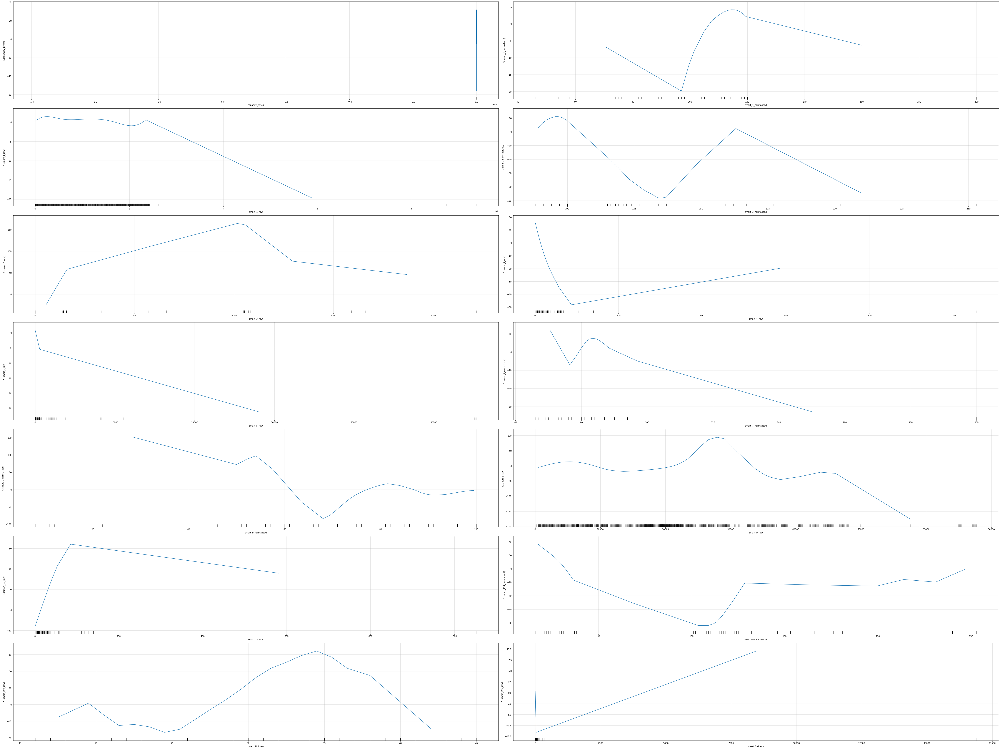

In [24]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(gam.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

##### Standardized data

In [25]:
n_folds = 10
n_repeats = 1
mses_rkf = np.empty(n_folds*n_repeats)
train_X_s = train_X_s.reset_index()
train_X_s = train_X_s.drop(columns = 'index')
train_y_s = train_y_s.reset_index()
train_y_s = train_y_s.drop(columns = 'index')
train_s = pd.concat([train_X_s,train_y_s],axis = 1)
for i,(train_index,test_index) in enumerate(folds.split(train_s)):
    gam = LinearGAM().fit(train_X_s.loc[train_index,:].values,train_y_s.loc[train_index,:].values)
    # compute test predictions
    y_pred = gam.predict(train_X_s.loc[test_index,:])
    # compute metric-mean-squared error
    mses_rkf[i] = mean_squared_error(train_y_s.loc[test_index,:],y_pred)

mse_cv = mses_rkf.mean()

r2_cv = 1-mse_cv/train_y_ns['useful_life'].var()

In [26]:
r2_cv

-0.8661573795458226

In [27]:
predictions = gam.predict(test_X_s)

In [28]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.20248608224244247
Test MSE:  1548.8685532123811


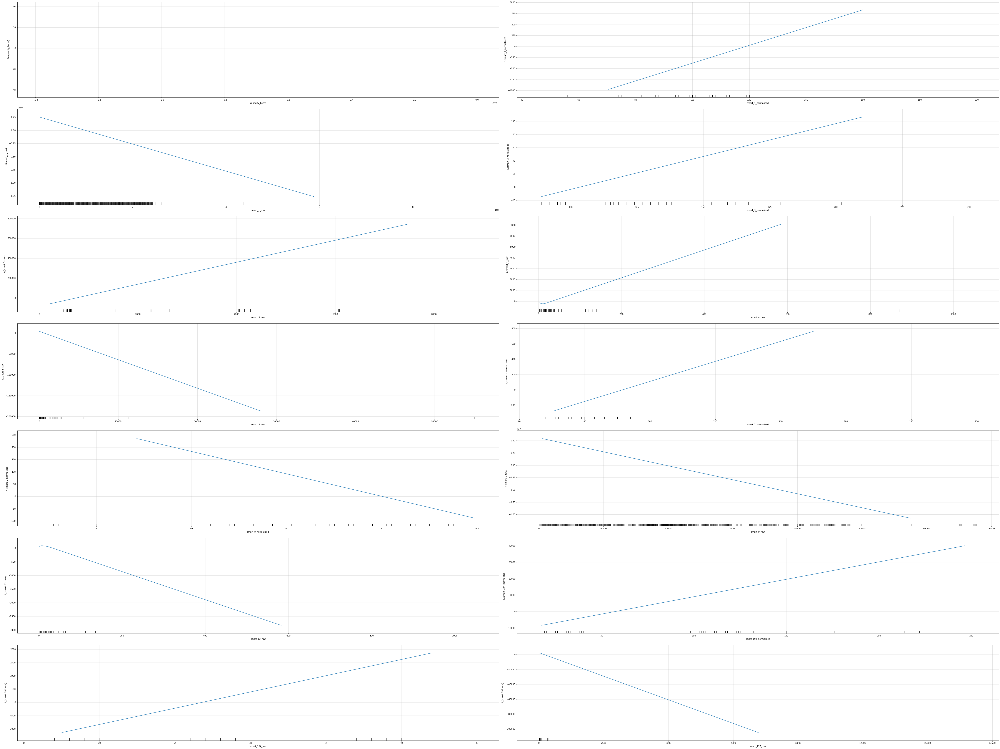

In [29]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(gam.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

### PPR

##### Non-standardized data

In [108]:
ppr = ProjectionPursuitRegressor()
search = GridSearchCV(ppr, ppr_params,scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

In [ ]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: -11029727.59539562
Best Hyperparameters: {'r': 10}


In [ ]:
#Checking test score with best model
best_model = ProjectionPursuitRegressor(r=10).fit(train_X_ns, train_y_ns)
predictions = best_model.predict(test_X_ns)

In [ ]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_ns, predictions))
print('Test MSE: ', mean_squared_error(test_y_ns, predictions))

Test R2 score:  0.12715049981134008
Test MSE:  1695.1793723308328


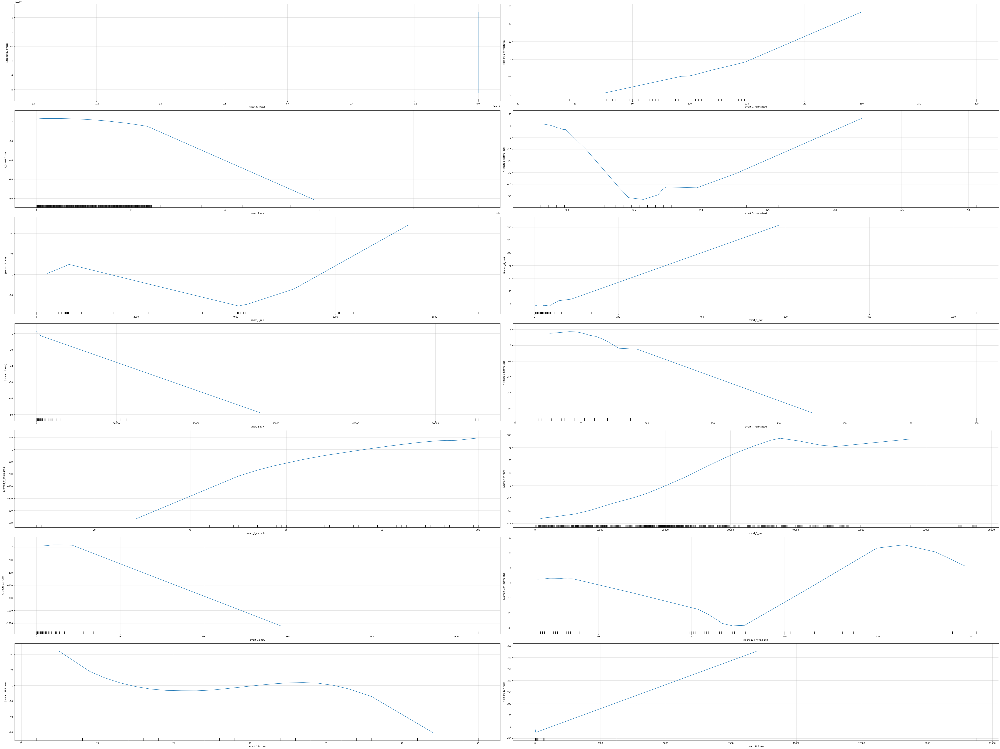

In [ ]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

##### Standardized data

In [ ]:
ppr = ProjectionPursuitRegressor()
search = GridSearchCV(ppr,ppr_params,scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_s, train_y_s)

In [ ]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: -10633077.099796891
Best Hyperparameters: {'r': 10}


In [ ]:
%%time
#Checking test score with best model
best_model = ProjectionPursuitRegressor(r=15).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

In [ ]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  -0.2705313549299928
Test MSE:  2467.5256665797992


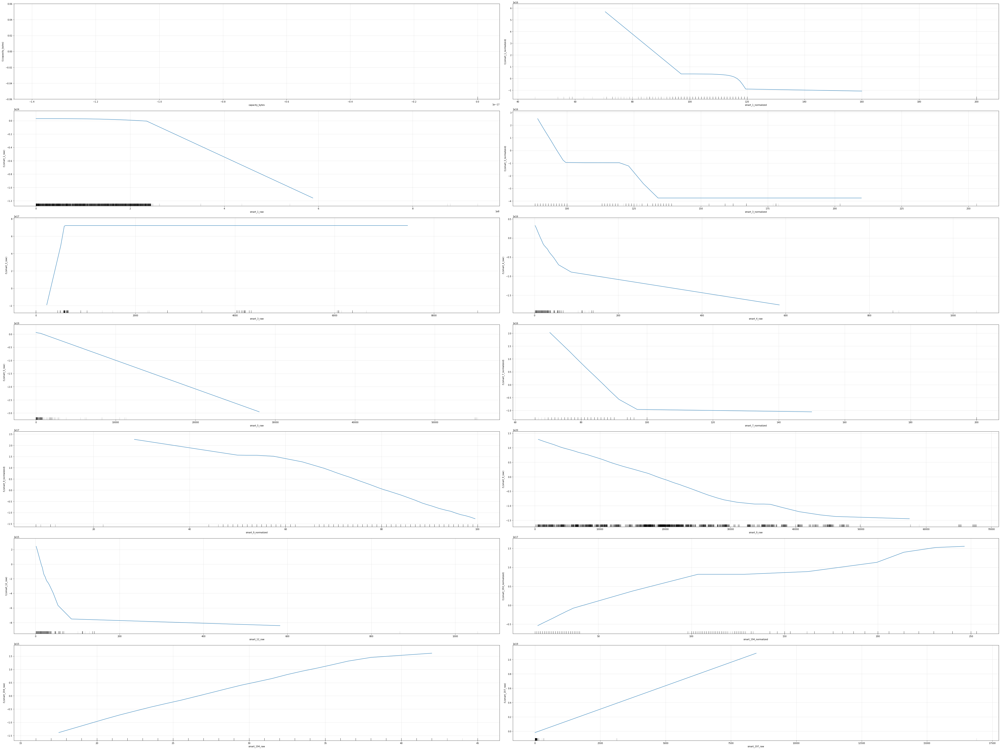

In [ ]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 7 x 2 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

# CatBoost

### Non-Standardized data 

In [ ]:
model = CatBoostRegressor()
# define search
search = GridSearchCV(model, cat_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_ns, train_y_ns)

66:	learn: 26.6075005	total: 308ms	remaining: 611ms
67:	learn: 26.2896749	total: 309ms	remaining: 599ms
68:	learn: 26.1789106	total: 310ms	remaining: 588ms
69:	learn: 26.0048270	total: 311ms	remaining: 578ms
70:	learn: 25.7539388	total: 330ms	remaining: 600ms
71:	learn: 25.6510103	total: 341ms	remaining: 606ms
72:	learn: 25.4740771	total: 343ms	remaining: 597ms
73:	learn: 25.4004632	total: 359ms	remaining: 612ms
74:	learn: 25.2299786	total: 360ms	remaining: 601ms
75:	learn: 25.0047815	total: 362ms	remaining: 590ms
76:	learn: 24.8189343	total: 377ms	remaining: 602ms
77:	learn: 24.5810642	total: 381ms	remaining: 597ms
78:	learn: 24.4499149	total: 387ms	remaining: 593ms
79:	learn: 24.2589092	total: 389ms	remaining: 584ms
80:	learn: 24.1977573	total: 391ms	remaining: 574ms
81:	learn: 24.0931349	total: 393ms	remaining: 565ms
82:	learn: 23.9812970	total: 395ms	remaining: 556ms
83:	learn: 23.8361024	total: 395ms	remaining: 546ms
84:	learn: 23.7400818	total: 398ms	remaining: 539ms
85:	learn: 2

In [ ]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.8622298273446777
Best Hyperparameters: {'max_depth': 5, 'n_estimators': 300}


In [ ]:
#Checking test score with best model
best_model = CatBoostRegressor(max_depth = result.best_params_['max_depth'], n_estimators = result.best_params_['n_estimators']).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

Learning rate set to 0.137664
0:	learn: 43.6861432	total: 1.69ms	remaining: 507ms
1:	learn: 43.0416491	total: 2.54ms	remaining: 379ms
2:	learn: 42.3809197	total: 3.36ms	remaining: 332ms
3:	learn: 41.8999292	total: 4.23ms	remaining: 313ms
4:	learn: 41.4200271	total: 5.13ms	remaining: 303ms
5:	learn: 40.8705280	total: 5.95ms	remaining: 291ms
6:	learn: 40.2685454	total: 6.73ms	remaining: 282ms
7:	learn: 40.0601001	total: 7.54ms	remaining: 275ms
8:	learn: 39.7066866	total: 8.38ms	remaining: 271ms
9:	learn: 39.0507407	total: 9.34ms	remaining: 271ms
10:	learn: 38.6509937	total: 10.1ms	remaining: 267ms
11:	learn: 38.1658035	total: 11ms	remaining: 263ms
12:	learn: 37.8902021	total: 11.8ms	remaining: 261ms
13:	learn: 37.5894045	total: 12.6ms	remaining: 258ms
14:	learn: 37.4200816	total: 13.4ms	remaining: 255ms
15:	learn: 36.9806338	total: 14.3ms	remaining: 254ms
16:	learn: 36.8312628	total: 15.1ms	remaining: 251ms
17:	learn: 36.6499445	total: 16ms	remaining: 250ms
18:	learn: 36.5257821	total: 1

In [ ]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.8588831893665552
Test MSE:  274.06592593938205


<BarContainer object of 15 artists>

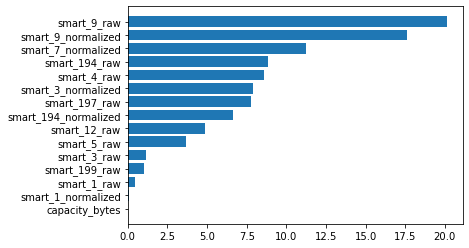

In [ ]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_s.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

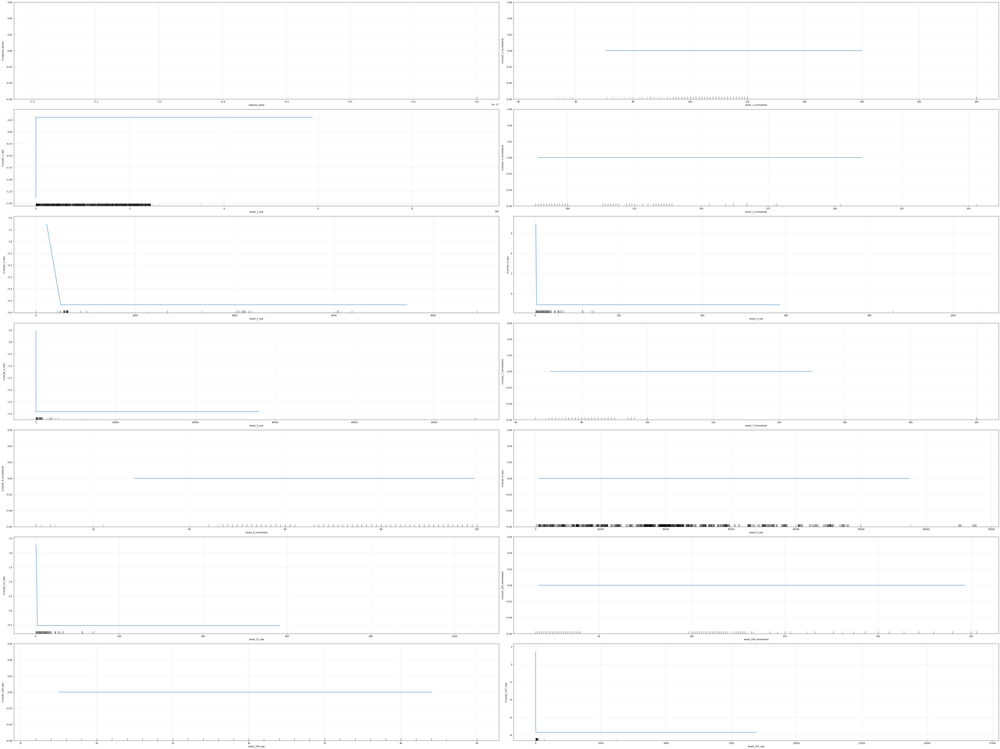

In [ ]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()

### Standardized data 

In [ ]:
model = CatBoostRegressor()
# define search
search = GridSearchCV(model, cat_params, scoring=scoring_metrics['r2_score'], n_jobs=-1, cv=folds)
# execute search
result = search.fit(train_X_s, train_y_s)

190:	learn: 19.1077293	total: 1.03s	remaining: 591ms
191:	learn: 19.0643064	total: 1.04s	remaining: 584ms
192:	learn: 19.0288214	total: 1.04s	remaining: 576ms
193:	learn: 18.9875469	total: 1.04s	remaining: 568ms
194:	learn: 18.9457772	total: 1.05s	remaining: 565ms
195:	learn: 18.8730991	total: 1.06s	remaining: 563ms
196:	learn: 18.8119587	total: 1.06s	remaining: 556ms
197:	learn: 18.7721983	total: 1.06s	remaining: 548ms
198:	learn: 18.7226754	total: 1.06s	remaining: 541ms
199:	learn: 18.5907111	total: 1.06s	remaining: 533ms
200:	learn: 18.5267819	total: 1.07s	remaining: 526ms
201:	learn: 18.5057693	total: 1.07s	remaining: 518ms
202:	learn: 18.4588821	total: 1.07s	remaining: 511ms
203:	learn: 18.4083308	total: 1.09s	remaining: 512ms
204:	learn: 18.3782760	total: 1.09s	remaining: 505ms
205:	learn: 18.3146680	total: 1.09s	remaining: 499ms
206:	learn: 18.2798953	total: 1.09s	remaining: 492ms
207:	learn: 18.2587107	total: 1.1s	remaining: 485ms
208:	learn: 18.1918512	total: 1.1s	remaining: 4

In [ ]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.8627177390709668
Best Hyperparameters: {'max_depth': 5, 'n_estimators': 300}


In [ ]:
%%time
#Checking test score with best model
best_model = CatBoostRegressor(max_depth = result.best_params_['max_depth'], n_estimators = result.best_params_['n_estimators']).fit(train_X_s, train_y_s)
predictions = best_model.predict(test_X_s)

Learning rate set to 0.137664
0:	learn: 43.6861432	total: 3.76ms	remaining: 1.12s
1:	learn: 43.0416491	total: 6.87ms	remaining: 1.02s
2:	learn: 42.3809197	total: 9.8ms	remaining: 970ms
3:	learn: 41.8999292	total: 12.5ms	remaining: 927ms
4:	learn: 41.4200271	total: 15.1ms	remaining: 888ms
5:	learn: 40.8705280	total: 18ms	remaining: 883ms
6:	learn: 40.2685454	total: 20.3ms	remaining: 848ms
7:	learn: 40.0601001	total: 22.1ms	remaining: 806ms
8:	learn: 39.7066866	total: 24.2ms	remaining: 783ms
9:	learn: 39.0507407	total: 25.8ms	remaining: 747ms
10:	learn: 38.6509937	total: 29.3ms	remaining: 769ms
11:	learn: 38.1658035	total: 31.5ms	remaining: 756ms
12:	learn: 37.8902021	total: 33.3ms	remaining: 736ms
13:	learn: 37.5894045	total: 35.1ms	remaining: 717ms
14:	learn: 37.4200816	total: 36.7ms	remaining: 696ms
15:	learn: 36.9806338	total: 38.5ms	remaining: 684ms
16:	learn: 36.8312628	total: 40.3ms	remaining: 670ms
17:	learn: 36.6499445	total: 42.2ms	remaining: 662ms
18:	learn: 36.5257821	total: 

In [ ]:
#Metrics on Test set
print('Test R2 score: ', r2_score(test_y_s, predictions))
print('Test MSE: ', mean_squared_error(test_y_s, predictions))

Test R2 score:  0.8588831893665552
Test MSE:  274.06592593938205


<BarContainer object of 15 artists>

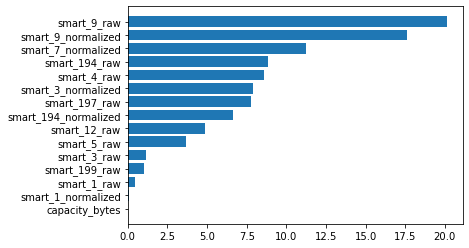

In [ ]:
#Plotting feature importance
feat_imp = best_model.feature_importances_

# naming the entries using Pandas series
feat_imp_named = pd.DataFrame({'Feature_Name': train_X_s.columns, 'Feature_Importance_Score': feat_imp})
feat_imp_named.sort_values(by = ['Feature_Importance_Score'], ascending=True, inplace = True)

plt.barh(feat_imp_named.Feature_Name, feat_imp_named.Feature_Importance_Score)

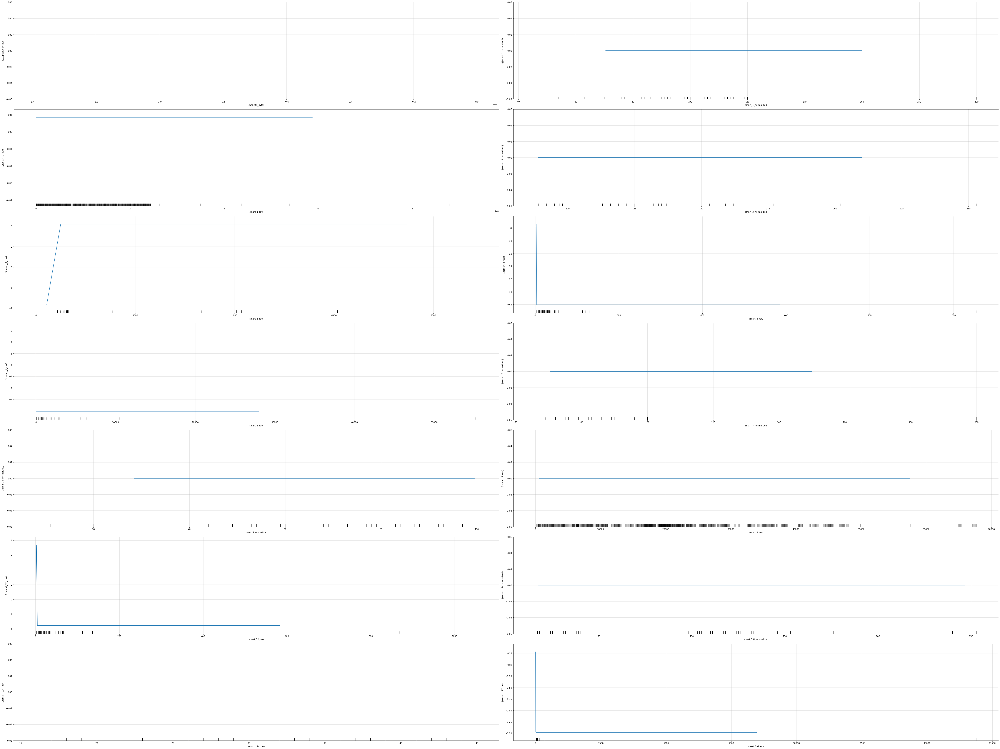

In [ ]:
#Plotting main effects
# first order effects of all 8 predictors, plotting in a 2 x 4 grid
num_rows=7
num_cols=2

X_dat = df.drop(columns = ['useful_life'], axis = 1)

fig,axs = plt.subplots(num_rows,num_cols,figsize=(64,48))
for i in range(num_rows):
    for j in range(num_cols):
        # select correct feature
        feature = X_dat.columns[num_cols*i + j]
        _ = first_order_aleplot_quant(best_model.predict,X_dat,feature,bins=50,ax=axs[i,j])

fig.tight_layout()